<a href="https://colab.research.google.com/github/jeremy0405/assignment3/blob/main/assignment3_pytorch_lanenet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!git clone https://github.com/Lhyejin/LaneNet-PyTorch.git

Cloning into 'LaneNet-PyTorch'...
remote: Enumerating objects: 191, done.
remote: Counting objects: 100% (191/191), done.
remote: Compressing objects: 100% (156/156), done.
remote: Total 191 (delta 55), reused 154 (delta 27), pack-reused 0
Receiving objects: 100% (191/191), 29.32 MiB | 25.51 MiB/s, done.
Resolving deltas: 100% (55/55), done.


In [1]:
%cd LaneNet-PyTorch//
!ls
!pip install -r requirements.txt

/content/LaneNet-PyTorch
dataset  LICENSE	      requirements.txt	Train.ipynb
img	 Notebook-experiment  test.py		TUSIMPLE
Lanenet  README.md	      Train_aug.ipynb	utils


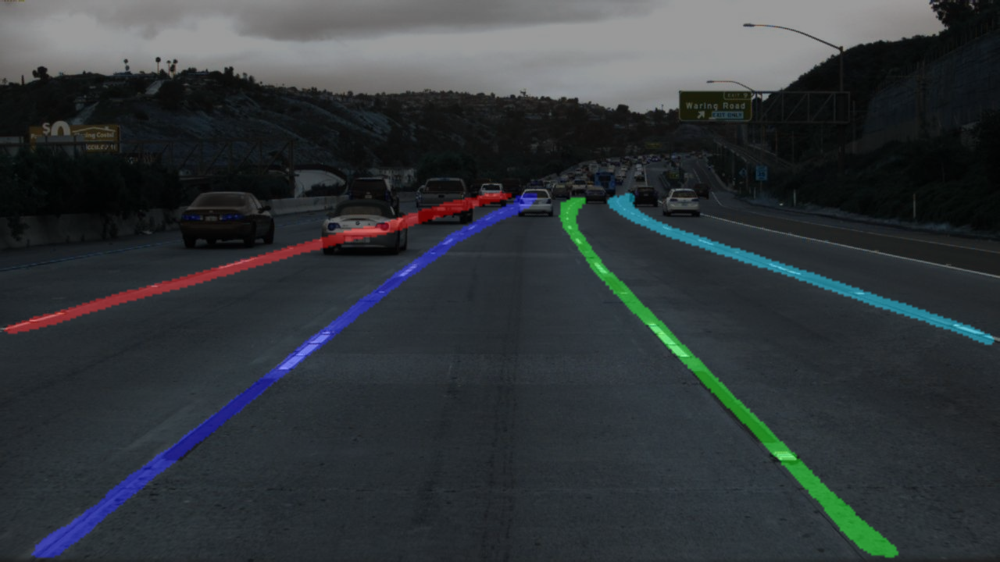

In [2]:
import os.path as ops
import numpy as np
import torch
import cv2
import time
import os
import matplotlib.pylab as plt
import sys
from tqdm import tqdm
import imageio
from dataset.dataset_utils import TUSIMPLE
from Lanenet.model2 import Lanenet
from utils.evaluation import gray_to_rgb_emb, process_instance_embedding
from google.colab.patches import cv2_imshow

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Load the Model
model_path = './TUSIMPLE/Lanenet_output/lanenet_epoch_39_batch_8.model'
LaneNet_model = Lanenet(2, 4)
LaneNet_model.load_state_dict(torch.load(model_path, map_location=torch.device(device)))
LaneNet_model.to(device)

def inference(gt_img_org):
    # BGR 순서
    org_shape = gt_img_org.shape
    gt_image = cv2.resize(gt_img_org, dsize=(512, 256), interpolation=cv2.INTER_LINEAR)
    gt_image = gt_image / 127.5 - 1.0
    gt_image = torch.tensor(gt_image, dtype=torch.float)
    gt_image = np.transpose(gt_image, (2, 0, 1))
    gt_image = gt_image.to(device)
    # lane segmentation 
    binary_final_logits, instance_embedding = LaneNet_model(gt_image.unsqueeze(0))
    binary_final_logits, instance_embedding = binary_final_logits.to('cpu'), instance_embedding.to('cpu') 
    binary_img = torch.argmax(binary_final_logits, dim=1).squeeze().numpy()
    binary_img[0:65,:] = 0

    # lane clustering & segemented frame embedding
    rbg_emb, cluster_result = process_instance_embedding(instance_embedding, binary_img,
                                                          distance=1.5, lane_num=4)

    rbg_emb = cv2.resize(rbg_emb, dsize=(org_shape[1], org_shape[0]), interpolation=cv2.INTER_LINEAR)
    a = 0.6
    frame = a * gt_img_org[..., ::-1] / 255 + rbg_emb * (1 - a)
    frame = np.rint(frame * 255)
    frame = frame.astype(np.uint8)

    return frame


image = cv2.imread('TUSIMPLE/test_clips/1494452927854312215/1.jpg')
cv2_imshow(inference(image))

In [30]:
def inference2(gt_img_org):
    # BGR 순서
    org_shape = gt_img_org.shape
    gt_image = cv2.resize(gt_img_org, dsize=(512, 256), interpolation=cv2.INTER_LINEAR)
    gt_image = gt_image / 127.5 - 1.0
    gt_image = torch.tensor(gt_image, dtype=torch.float)
    gt_image = np.transpose(gt_image, (2, 0, 1))
    gt_image = gt_image.to(device)
    # lane segmentation 
    binary_final_logits, instance_embedding = LaneNet_model(gt_image.unsqueeze(0))
    binary_final_logits, instance_embedding = binary_final_logits.to('cpu'), instance_embedding.to('cpu') 
    binary_img = torch.argmax(binary_final_logits, dim=1).squeeze().numpy()
    binary_img[0:65,:] = 0

    # lane clustering & segemented frame embedding
    rbg_emb, cluster_result = process_instance_embedding(instance_embedding, binary_img,
                                                          distance=0.6, lane_num=3)     ## lane_num 을 동영상의 lane 개수에 맞추어 변경하였고 lane detection이 더 잘 되도록 distance를 변경하였다

    rbg_emb = cv2.resize(rbg_emb, dsize=(org_shape[1], org_shape[0]), interpolation=cv2.INTER_LINEAR)
    a = 0.6
    frame = a * gt_img_org[..., ::-1] / 255 + rbg_emb * (1 - a)
    frame = np.rint(frame * 255)
    frame = frame.astype(np.uint8)

    return frame


In [31]:
def video2segemented_video(video_path):

# TODO: video to frames
    capture = cv2.VideoCapture(video_path)        #구글 드라이브에 마운트하여 구글 드라이브에 있는 input.mp4 동영상을 capture 변수에 VideoCapture를 이용하여 프레임별로 분할하였다.


    fps = capture.get(cv2.CAP_PROP_FPS)           # fps는 기존 동영상의 fps를 이용한다 (fps = 30)
    w = round(capture.get(cv2.CAP_PROP_FRAME_WIDTH))    # width는 기존 동영상의 width를 이용한다 (width = 1280)
    h = round(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))   # height는 기존 동영상의 height를 이용한다 (height = 720)
    fourcc = cv2.VideoWriter_fourcc(*'DIVX')            # window에서 저장할 비디오 코덱을 지정한다.
    out = cv2.VideoWriter('/content/drive/My Drive/output.mp4', fourcc, fps, (w, h))      # 구글 드라이브에 output.mp4 파일로 저장하며 fps, width, height는 기존의 동영상과 같게 한다

    while cv2.waitKey(33) < 0:
      if capture.get(cv2.CAP_PROP_POS_FRAMES) == capture.get(cv2.CAP_PROP_FRAME_COUNT):   # 동영상이 끝나면 break되도록 설정하였다.
        capture.set(cv2.CAP_PROP_POS_FRAMES, 0)
        break
   
      ret, frame = capture.read()       # 동영상이 프레임별로 저장되어있는 capture를 read() 하여 frame에 프레임별 이미지를 넣어주었다.
      if ret:
   
# TODO: extract lane from frame
        cv2_imshow(inference2(frame))   # skelton 파일의 inference에서 lane_num과 distance를 변경한 inference2 를 이용하여 lane을 추출하였다.
                
   
# TODO: frames to video & store video
        out.write(inference2(frame))    # 위에서 정의한 out에 wirte를 이용하여 이미지를 비디오로 만든 후 저장하였다. 
    
    capture.release()
    out.release()
    cv2.destroyAllWindows

    pass
      

In [32]:
 # 이미지의 fps와 width, height를 print를 통하여 정확한 값을 확인함
  
    capture = cv2.VideoCapture("/content/drive/My Drive/input.mp4")

    fps = capture.get(cv2.CAP_PROP_FPS)
    w = round(capture.get(cv2.CAP_PROP_FRAME_WIDTH))
    h = round(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))

    print(fps)
    print(w)
    print(h)

30.0
1280
720


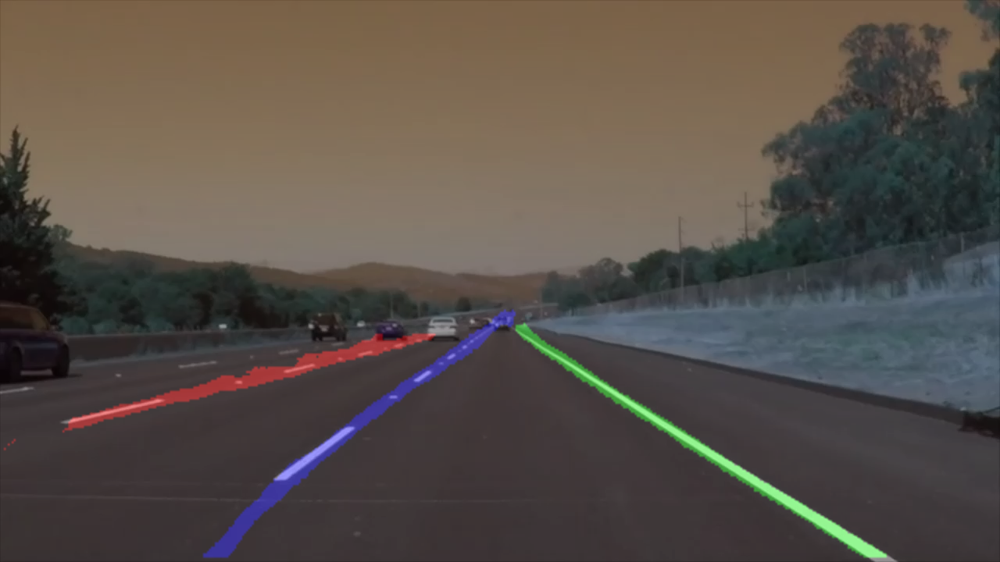

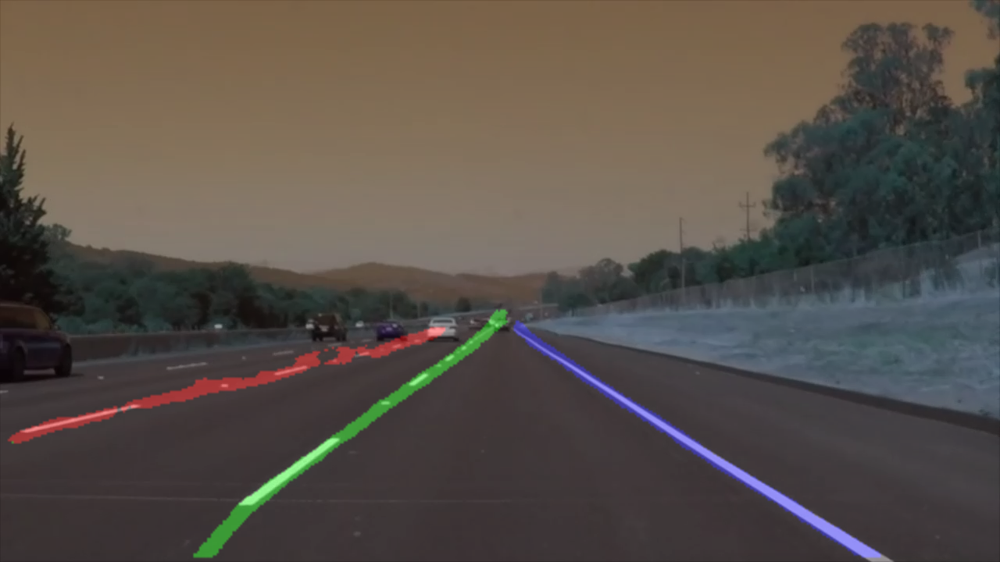

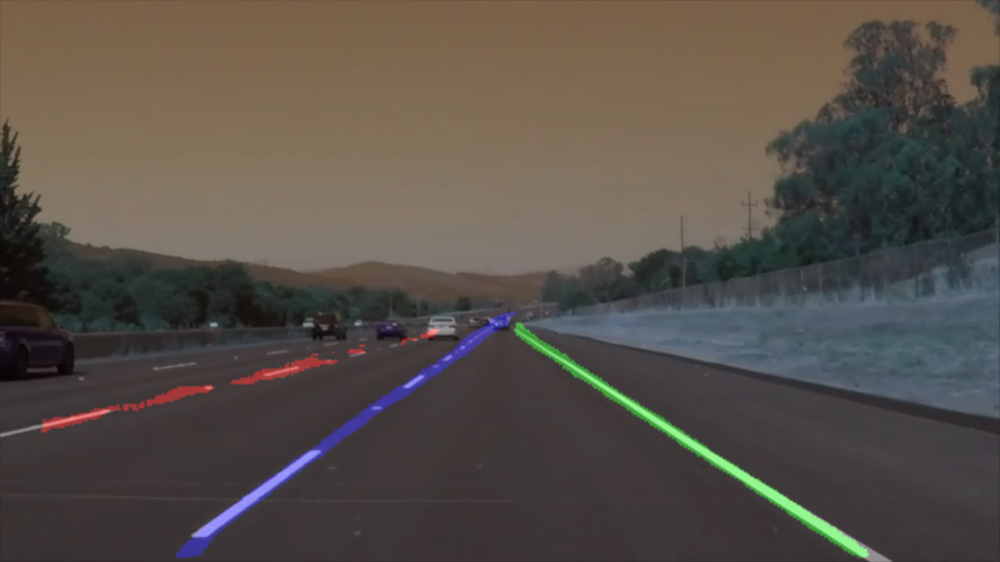

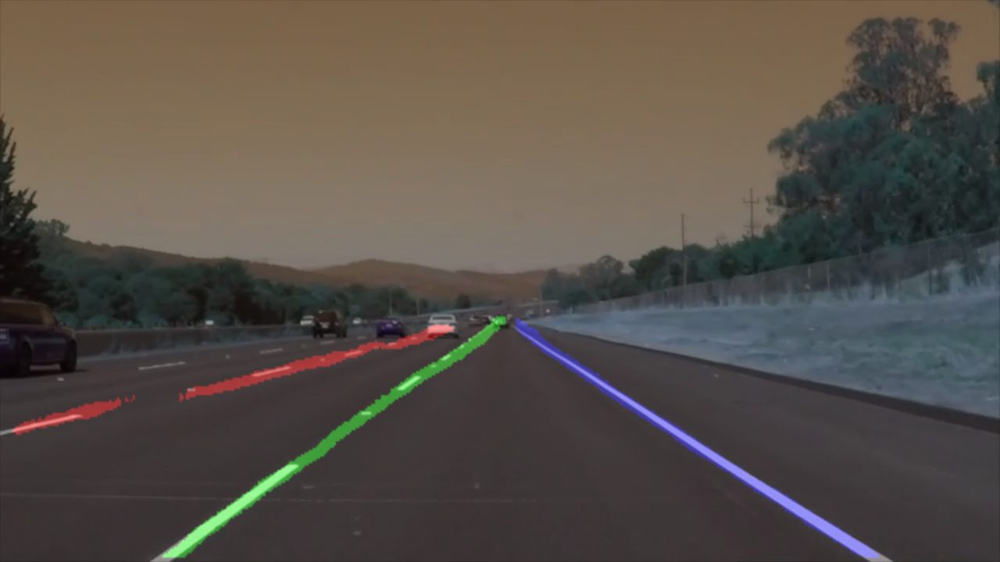

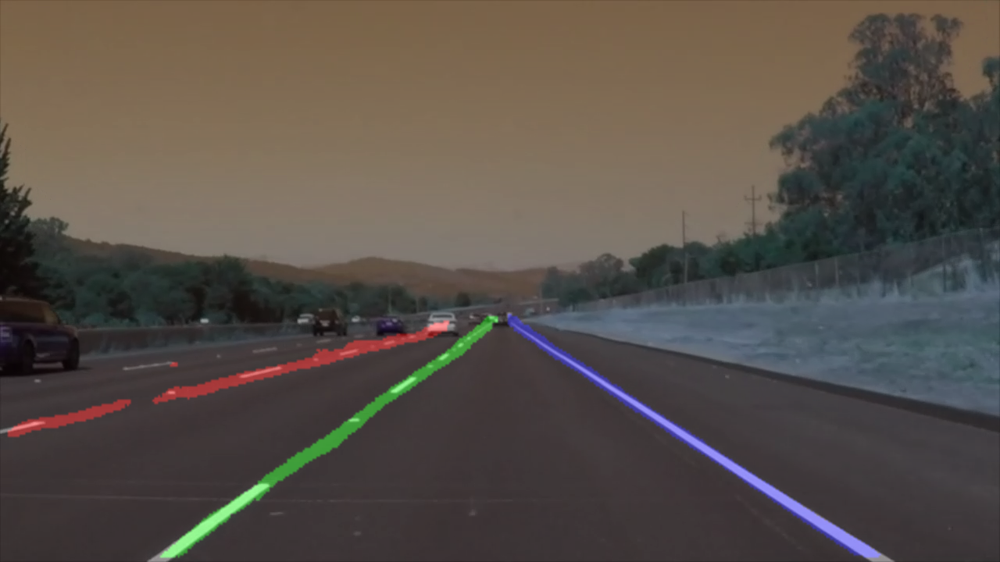

...

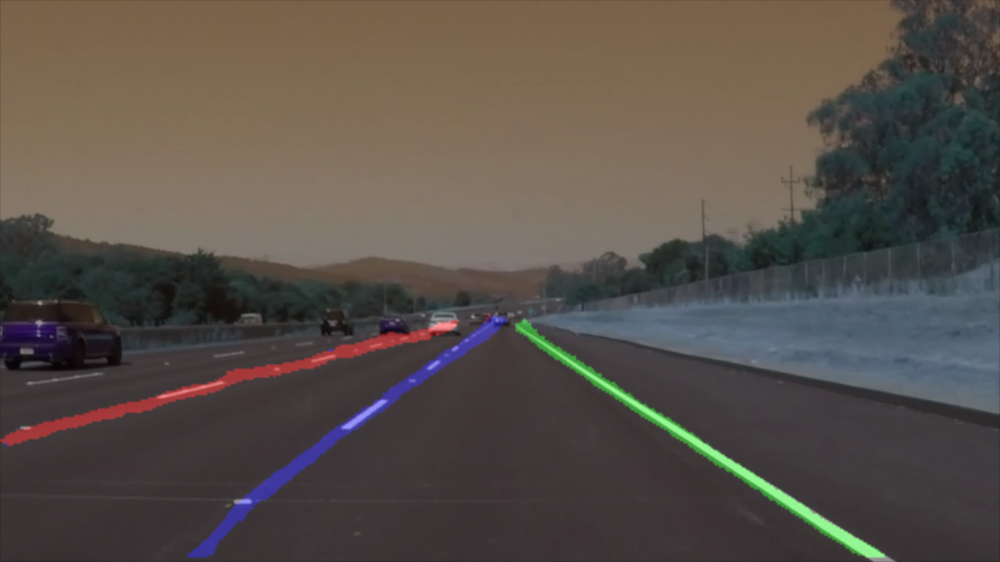

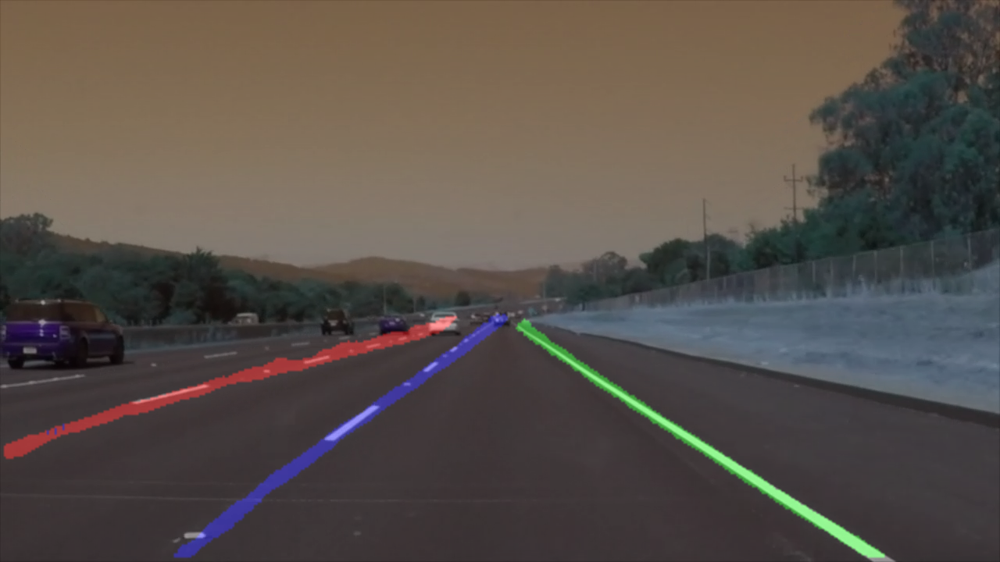

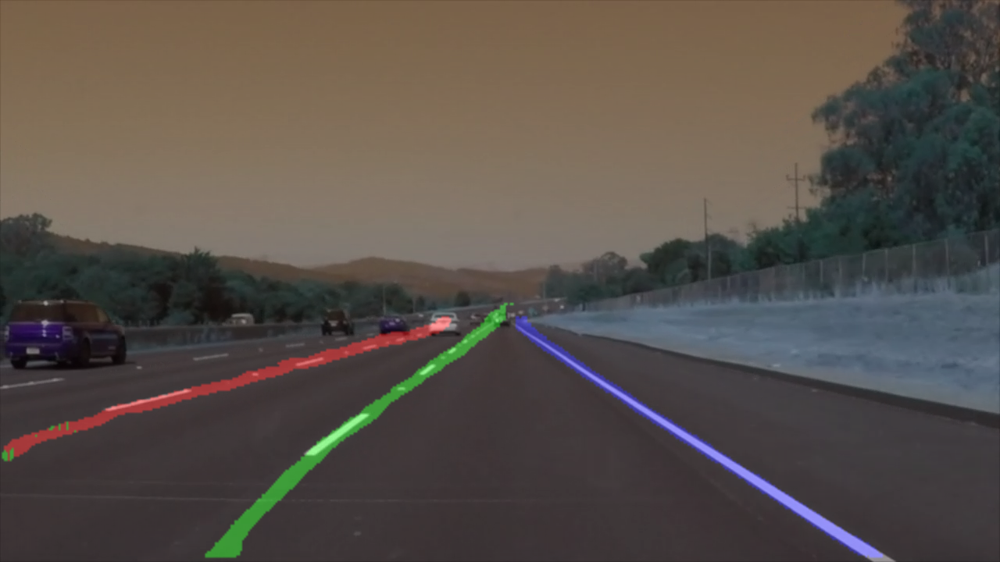

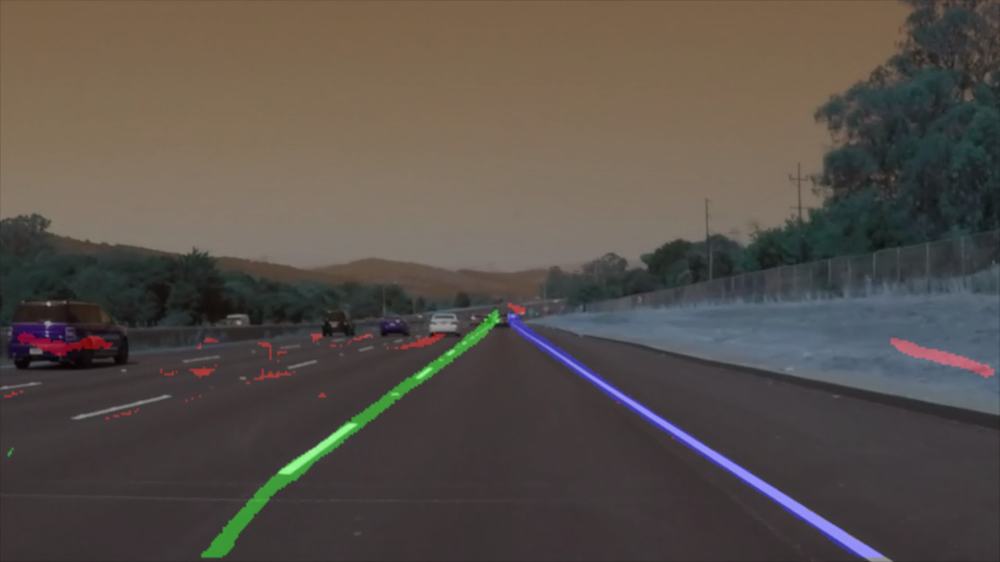

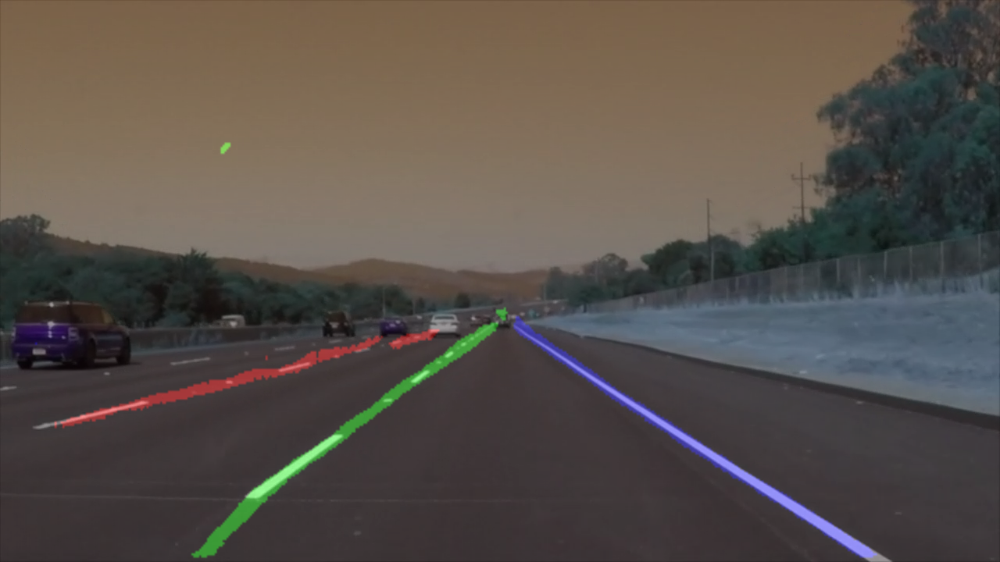

In [33]:
# Test
video_path = "/content/drive/My Drive/input.mp4" # input your video path
video2segemented_video(video_path)